<a href="https://colab.research.google.com/github/MahaleVivek/PaddleOCR_with_LLM/blob/main/PaddleOCR_and_Zephyr_7B.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install git+https://github.com/huggingface/transformers.git
!pip install accelerate

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-n_m1szu8
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-n_m1szu8
  Resolved https://github.com/huggingface/transformers.git to commit b109257f4fb8b1166e7c53cc5418632014ed53a5
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
##Pre-requisite libraries for PaddleOCR

!git clone https://github.com/PaddlePaddle/PaddleOCR.git
!python3 -m pip install paddlepaddle-gpu
!pip install "paddleocr>=2.0.1"

fatal: destination path 'PaddleOCR' already exists and is not an empty directory.


In [3]:
#get all the imports out of the way

import torch
from paddleocr import PaddleOCR, draw_ocr
from transformers import pipeline

In [4]:
#write the OCR through PaddleOCR first.    #It is one time process

ocr = PaddleOCR(use_angle_cls=True, lang='en',use_space_char=True,show_log=False,enable_mkldnn=True)

In [5]:
%%time

img_path = '/content/stanford_front.jpg'
result = ocr.ocr(img_path, cls=True)

#print(result)

ocr_string = ""
#Extract the text from the OCR result and concatenate it to ocr_string
for i in range(len(result[0])):
    ocr_string = ocr_string + result[0][i][1][0] + " "

CPU times: user 582 ms, sys: 200 ms, total: 783 ms
Wall time: 809 ms


In [6]:
ocr_string

'RAFAEL ULATE DIRECTOR OF ADMISSIONS DEPARTMENT OF ELECTRICAL ENGINEERING DAVID PACKARD ELECTRICAL ENGINEERING 350 SERRA MALL ROOM 170 TEL:650)725-9327 STANFORD UNIVERSITY FAX:650)723-1882 STANFORD,CALIFORNIA 94305-9505 ulate@ee.stanford.edu '

In [7]:
from google.colab.patches import cv2_imshow
import cv2

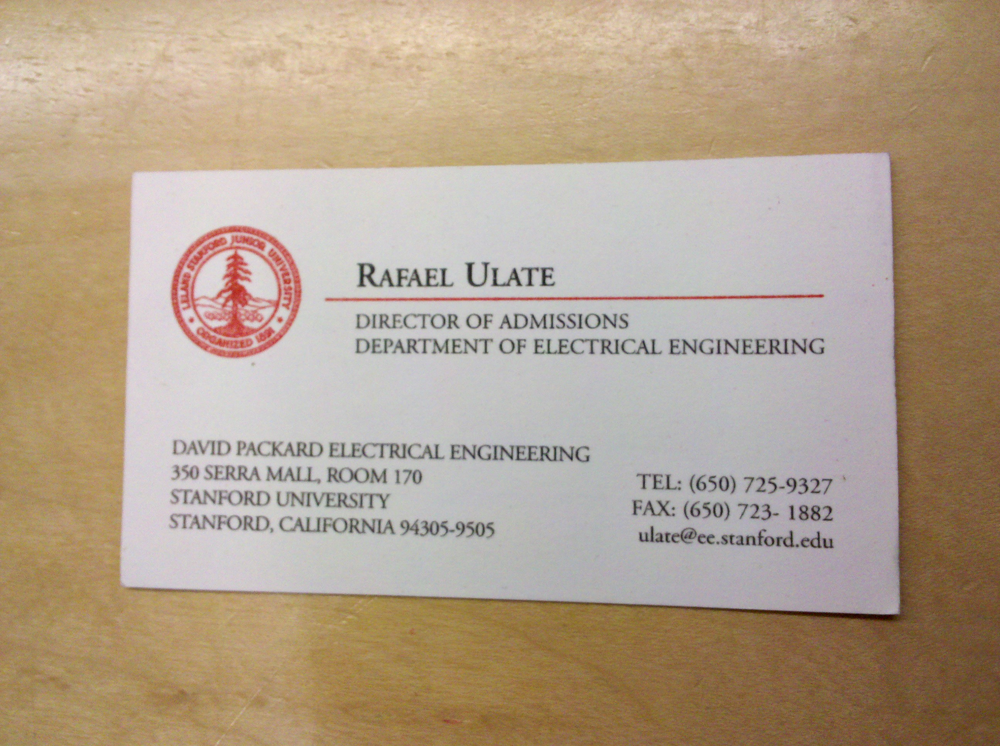

In [8]:
img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

In [9]:
#move onto the LLM code.

pipe = pipeline("text-generation", model="HuggingFaceH4/zephyr-7b-alpha", torch_dtype=torch.bfloat16, device_map="auto")

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

In [10]:
# Each message can have 1 of 3 roles: "system" (to provide initial instructions), "user", or "assistant". For inference, make sure "user" is the role in the final message.
messages = [
    {
        "role": "system",
        "content": "You are a JSON converter which receives business card OCR information as a string and returns a structured JSON output by organising the information in the string.",
    },
    {"role": "user", "content": f"Extract the name of the the person, Designation, contact number, company name, email address, and location from this OCR data: {ocr_string}"},
]

#refer: https://huggingface.co/docs/transformers/main/en/chat_templating

prompt = pipe.tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

In [11]:
outputs = pipe(prompt, max_new_tokens=1000, do_sample=True, temperature=0.7, top_k=50, top_p=0.95)
print(outputs[0]["generated_text"])

<|system|>
You are a JSON converter which receives business card OCR information as a string and returns a structured JSON output by organising the information in the string.</s>
<|user|>
Extract the name of the the person, Designation, contact number, company name, email address, and location from this OCR data: RAFAEL ULATE DIRECTOR OF ADMISSIONS DEPARTMENT OF ELECTRICAL ENGINEERING DAVID PACKARD ELECTRICAL ENGINEERING 350 SERRA MALL ROOM 170 TEL:650)725-9327 STANFORD UNIVERSITY FAX:650)723-1882 STANFORD,CALIFORNIA 94305-9505 ulate@ee.stanford.edu </s>
<|assistant|>
```json
{
  "Name": "RAFAEL ULATE",
  "Designation": "DIRECTOR OF ADMISSIONS DEPARTMENT OF ELECTRICAL ENGINEERING",
  "Contact Number": "TEL:650)725-9327",
  "Company Name": "DAVID PACKARD ELECTRICAL ENGINEERING",
  "Email Address": "ulate@ee.stanford.edu",
  "Location": "Stanford University, Fax: 650)723-1882\nStanford,CALIFORNIA 94305-9505"
}
```

Note: The location is in multiple lines, so to ensure proper formatting i